## Copyright 2023 Google LLC

In [ ]:
# Copyright 2023 Google LLC
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#      http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# MultiDiffusion with StyleAligned over SD v2

In [1]:
import torch
from diffusers import StableDiffusionPanoramaPipeline, DDIMScheduler
import mediapy
import sa_handler
import pipeline_calls

In [2]:
# init models
model_ckpt = "stabilityai/stable-diffusion-2-base"
scheduler = DDIMScheduler.from_pretrained(model_ckpt, subfolder="scheduler")
pipeline = StableDiffusionPanoramaPipeline.from_pretrained(
     model_ckpt, scheduler=scheduler, torch_dtype=torch.float16
).to("cuda")

sa_args = sa_handler.StyleAlignedArgs(share_group_norm=True,
                                      share_layer_norm=True,
                                      share_attention=True,
                                      adain_queries=True,
                                      adain_keys=True,
                                      adain_values=False,
                                     )
handler = sa_handler.Handler(pipeline)
handler.register(sa_args)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

unet/config.json:   0%|          | 0.00/1.01k [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/738 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/929 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/716 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

reference,result

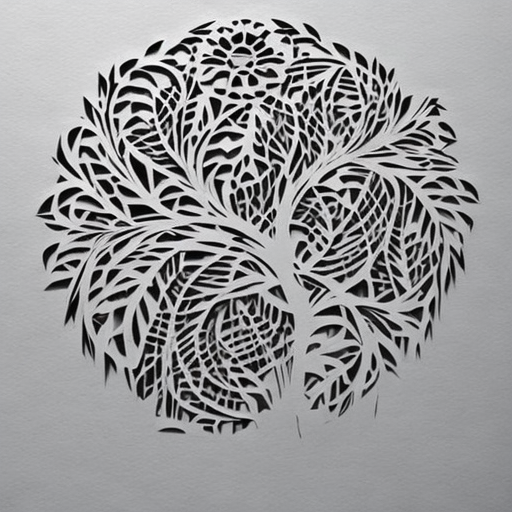
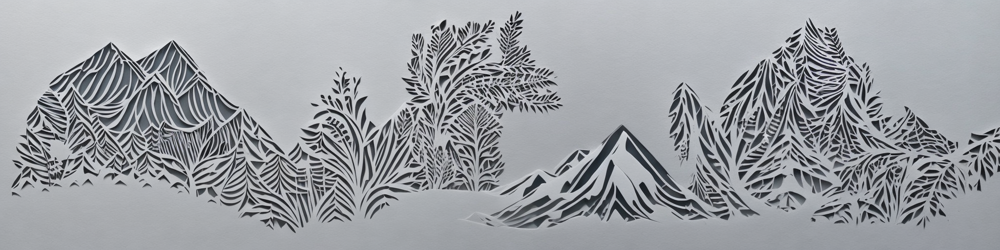

  0%|          | 0/50 [00:00<?, ?it/s]

reference,result

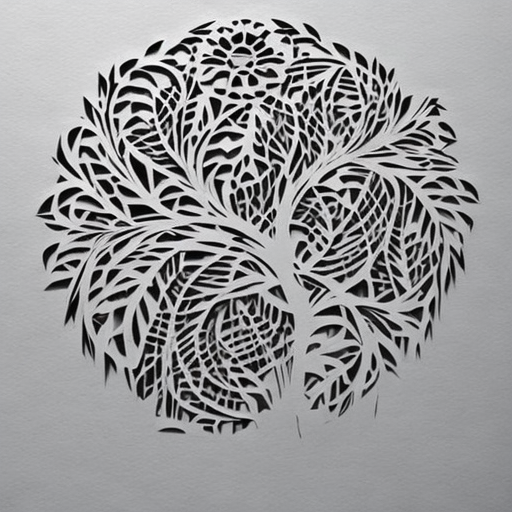
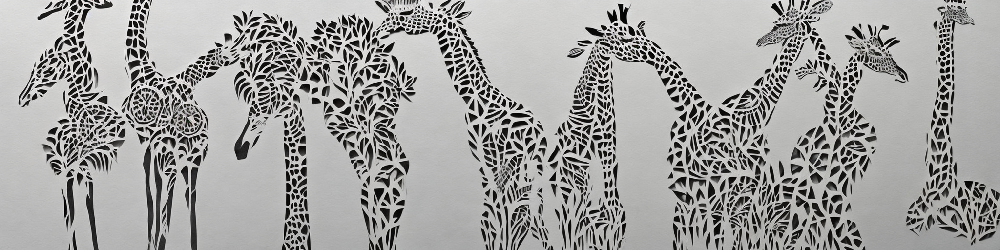

In [6]:
# run MultiDiffusion with StyleAligned

reference_prompt = "a beautiful papercut art design"
target_prompts = ["mountains in a beautiful papercut art design", "giraffes in a beautiful papercut art design"]
view_batch_size = 25  # adjust according to VRAM size
reference_latent = torch.randn(1, 4, 64, 64,)
for target_prompt in target_prompts:
    images = pipeline_calls.panorama_call(pipeline, [reference_prompt, target_prompt], reference_latent=reference_latent, view_batch_size=view_batch_size)
    mediapy.show_images(images, titles=["reference", "result"])

In [ ]:
# MultiDiffusion with StyleAligned over AnimeModel

In [9]:
# init models
model_ckpt = "stablediffusionapi/anything-v5"
scheduler = DDIMScheduler.from_pretrained(model_ckpt, subfolder="scheduler")
pipeline = StableDiffusionPanoramaPipeline.from_pretrained(
     model_ckpt, scheduler=scheduler, torch_dtype=torch.float16,
     safety_checker=None
).to("cuda")

sa_args = sa_handler.StyleAlignedArgs(share_group_norm=True,
                                      share_layer_norm=True,
                                      share_attention=True,
                                      adain_queries=True,
                                      adain_keys=True,
                                      adain_values=False,
                                     )
handler = sa_handler.Handler(pipeline)
handler.register(sa_args)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion_panorama.pipeline_stable_diffusion_panorama.StableDiffusionPanoramaPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/50 [00:00<?, ?it/s]

reference,result

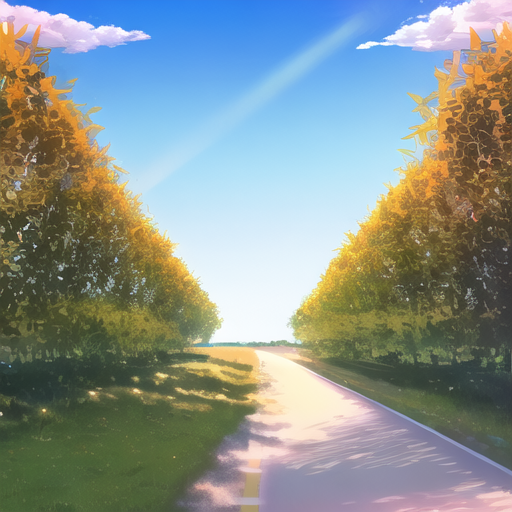
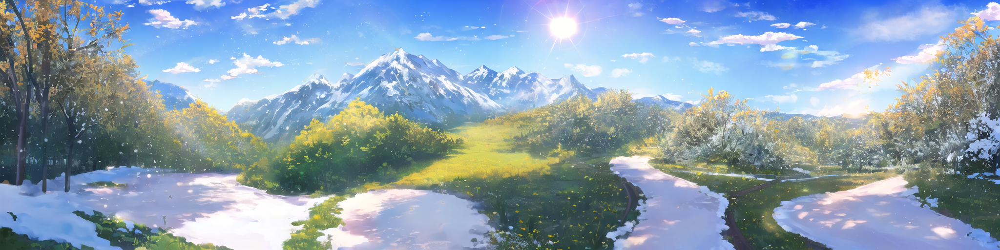

In [10]:
# run MultiDiffusion with StyleAligned

reference_prompt = "sunny day, clear sky, (background only:1.2)"
target_prompts = ["a beautiful snow valley on sunny day, clear sky, (background only:1.2)"]
view_batch_size = 25  # adjust according to VRAM size
reference_latent = torch.randn(1, 4, 64, 64,) # random results
for target_prompt in target_prompts:
    images = pipeline_calls.panorama_call(pipeline, [reference_prompt, target_prompt], reference_latent=reference_latent, view_batch_size=view_batch_size)
    mediapy.show_images(images, titles=["reference", "result"])

  0%|          | 0/50 [00:00<?, ?it/s]

reference,result

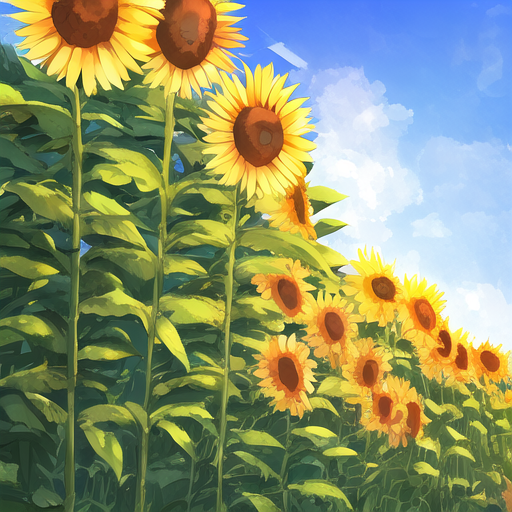
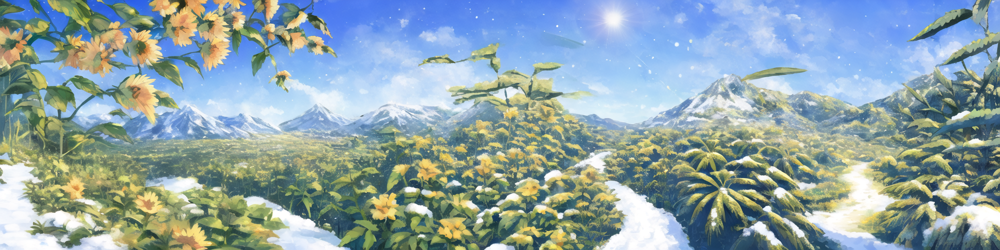

In [15]:
torch.random.manual_seed(0)
reference_latent = torch.randn(1, 4, 64, 64,) # fixed results
for target_prompt in target_prompts:
    images = pipeline_calls.panorama_call(pipeline, [reference_prompt, target_prompt], reference_latent=reference_latent, view_batch_size=view_batch_size)
    mediapy.show_images(images, titles=["reference", "result"])

  0%|          | 0/50 [00:00<?, ?it/s]

reference,result

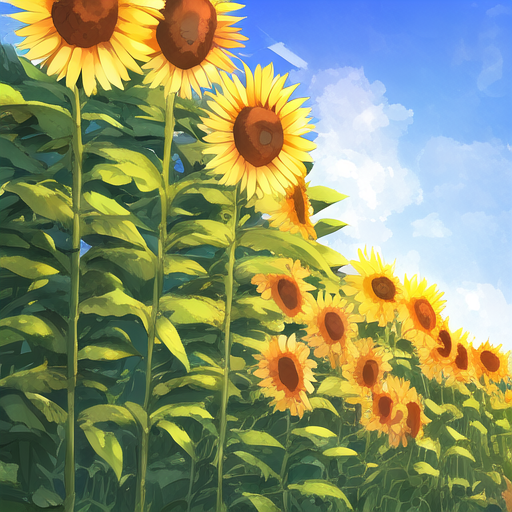
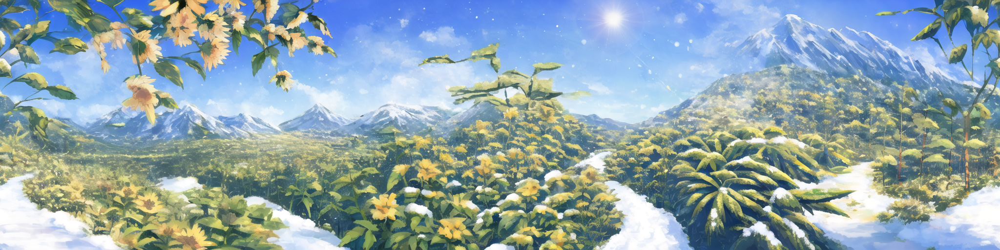

In [16]:
torch.random.manual_seed(0)
reference_latent = torch.randn(1, 4, 64, 64,) # fixed results
for target_prompt in target_prompts:
    images = pipeline_calls.panorama_call(pipeline, [reference_prompt, target_prompt], reference_latent=reference_latent, view_batch_size=view_batch_size, circular_padding=True)
    mediapy.show_images(images, titles=["reference", "result"])

In [ ]:
# VRAM=10.1GB